In [1]:
import sys
sys.path.append(r"/mnt/ceph/users/tudomlumleart/00_VirtualEnvironments/teeu/lib/python3.10/site-packages")
sys.path.append(r"/mnt/home/tudomlumleart/.local/lib/python3.10/site-packages/")
sys.path.append(r"/mnt/home/tudomlumleart/ceph/00_VirtualEnvironments/jupyter-gpu/lib/python3.10/site-packages")
import jax.numpy as jnp
import jax
import numpyro

from numpyro import handlers
from numpyro.infer import MCMC, NUTS
import matplotlib.pyplot as plt
from functions import *
from utils import *

os.environ["XLA_PYTHON_CLIENT_MEM_FRACTION"] = ".1"
os.environ["XLA_PYTHON_CLIENT_PREALLOCATE"] = "false"  # add this
os.environ["XLA_PYTHON_CLIENT_ALLOCATOR"] = "platform"

# jax.config.update("jax_debug_nans", True)

def logprior(dmap_flat, num_probes):
    """
    """
    return jnp.sum(jnp.array(logprior_(dmap_flat, num_probes)))

@partial(jax.jit, static_argnums=(1, ))
def logprior_(dmap_flat, num_probes):
    """
    """
    # Get 2D map back to simplify the expression 
    dmap = jnp.reshape(dmap_flat, [num_probes, num_probes])
    
    # Calculate the squared end-to-end distance 
    R_sq = dmap[0][-1] ** 2
    
    # Calculate the average bond length
    b = jnp.mean(jnp.diag(dmap, 1))
    
    N = num_probes
    
    # Calculate the probability
    scaling_factor = 1.5 * jnp.log(3/(2*np.pi*N*b**2))
    gaussian_term = -3*R_sq/(2*N*b**2)
    
    # print('Scaling factor = {}'.format(scaling_factor))
    # print('Gaussian term = {}'.format(gaussian_term))
    
    return scaling_factor, gaussian_term 

def gsm_helper(x, num_components, dimensions):
    # make sure the dimensions are correct
    # assert x.shape[0] == num_components * dimensions
    num_samples = x.shape[0]
    
    # # reshape the input
    # x = jnp.reshape(x, [num_components, dimensions])
    
    vmap_batch_lp = jax.vmap(log_posterior, in_axes=(0, None, None, None, None, None, None))
    
    # calculate the log posterior 
    # change this argument in real function 
    lp = jnp.sum(vmap_batch_lp(x, observation_flatten_list, true_weights, measurement_error, num_probes, num_components, dimensions))
    
    return lp

def log_posterior(metastructures, observations, metastructure_weights,
                  measurement_error, num_probes, num_components, dimensions):
    """
    Calculate the logarithm of the posterior probability distribution.

    Parameters
    ----------
    metastructures : 2-dimension array_like
        The metastructures representing the chromatin ensemble.
    observations : array_like
        The flattened observations.
    metastructure_weights : array_like
        The number of observations for each probe.
    measurement_error : float
        The measurement error.
    num_probes : int
        The number of probes.

    Returns
    -------
    float
        The logarithm of the posterior probability distribution.
    """
    metastructures = jnp.array(metastructures)
    # jax.debug.print("{x}", x=metastructures.shape)
    metastructures = jnp.reshape(metastructures, [num_components, dimensions])
    
    # Make sure metastructures, observations, and metastructure_weights are jnp arrays
    
    observations = jnp.array(observations)
    # jax.debug.print("{x}", x=observations.shape)
    metastructure_weights = jax.nn.softmax(metastructure_weights)
    metastructure_weights = jnp.reshape(metastructure_weights, [num_components, 1])
    jax.debug.print("{x}", x=metastructure_weights.sum())
    # jax.debug.print("{x}", x=metastructure_weights)
    # make sure that metastructure_weights is > 0
    # metastructure_weights = jnp.abs(metastructure_weights)
    # metastructure_weights += jnp.finfo(jnp.float64).tiny
    
    # Set weight prior to be categorical distribution
    weight_prior = 1/len(metastructure_weights)
    
    # Calculate log posterior in batch using vmap
    vmap_batch_log_posterior = jit(jax.vmap(log_posterior_one_obs, in_axes=(None, 0, None, None, None, None)), static_argnums=(3, 4, 5))
    lp = vmap_batch_log_posterior(metastructures, observations, metastructure_weights, weight_prior, measurement_error, num_probes)
    # jax.debug.print("log prob = {x}, {y}", x=lp, y=metastructure_weights)
    log_posterior_total = jnp.sum(lp)
    
    return log_posterior_total

# Write a helper function to calculate the argument for logsumexp function for each metastructure
def _log_posterior_one_obs_helper(metastructure, observation, metastructure_weight, weight_prior,
                  measurement_error, num_probes):
    """_summary_

    Args:
        metastructures (_type_): _description_
        observations (_type_): _description_
        metastructure_weights (_type_): _description_
        measurement_error (_type_): _description_
        num_probes (_type_): _description_
        batch_size (_type_): _description_
    """
    # Calculate log weights 
    lw = jnp.log(metastructure_weight)
    
    # Calculate log likelihood
    lp = loglikelihood(observation, metastructure, measurement_error, num_probes)
    
    # Calculate log prior weights
    lpw = jnp.log(weight_prior)
    
    # Calculate log prior for metastructure
    lpm = logprior(metastructure, num_probes)
    
    # jax.debug.print("log prob = {x},\n log prior weight = {y},\n log prior metastructure = {z},\n log weights = {a}", x=lp, y=lpw, z=lpm, a=lw)
    
    return lw + lp + lpw + lpm

# Calculate the log posterior inside the logsumexp function
# Use vmap for autobatching 

def log_posterior_one_obs(metastructures, observation, metastructure_weights, weight_prior,
                  measurement_error, num_probes):
    """
    Calculate the logarithm of the posterior probability distribution.

    Parameters
    ----------
    metastructures : 2-dimension array_like
        The metastructures representing the chromatin ensemble.
    observations : array_like
        The flattened observations.
    metastructure_weights : array_like
        The number of observations for each probe.
    measurement_error : float
        The measurement error.
    num_probes : int
        The number of probes.

    Returns
    -------
    float
        The logarithm of the posterior probability distribution.
    """
    # Calculate the argument for logsumexp function 
    vmap_batch_lse_arg = jit(vmap(_log_posterior_one_obs_helper, (0, None, 0, None, None, None)), static_argnums=(3,4,5))
    lse_arg = vmap_batch_lse_arg(metastructures, observation, metastructure_weights, weight_prior, measurement_error, num_probes)
    
    # Calculate LSE
    lse = jax.scipy.special.logsumexp(lse_arg)
    
    return lse

def load_dataset(pickle_file):
    """
    Load the dataset from the pickle file.

    Parameters
    ----------
    pickle_file : str
        The path to the pickle file containing the dataset.

    Returns
    -------
    tuple
        A tuple of the observation list, the true labels, and a dictionary of parameters.

    Raises
    ------
    FileNotFoundError
        If the pickle file does not exist.

    Notes
    -----
    This function loads the dataset from a pickle file. The pickle file should contain a tuple
    with the observation list and the true labels. It also extracts parameters from the file name
    and puts them in a dictionary.

    Example
    -------
    >>> pickle_file = 'data.pickle'
    >>> observation_list, labels_true, param_dict = load_dataset(pickle_file)
    """
    with open(pickle_file, 'rb') as f:
        dataset_list = pickle.load(f)

        
    # Extract parameters from file name
    # Remove .pkl file suffix
    pickle_file = pickle_file.replace('.pkl', '')
    params = os.path.basename(pickle_file).split('_')[1:]
    params = [int(p) if p.isdigit() else float(p) for p in params]

    # Put the parameters in a dictionary
    param_dict = {
        'num_monomers': params[0],
        'mean_bond_length': params[1],
        'std_bond_length': params[2],
        'num_templates': params[3],
        'weights_dist': params[4],
        'noise_std': params[5],
        'num_observations': params[6]
    }
        
    return dataset_list, param_dict
    


In [2]:
# Load the data from the dataset 
dataset_dir = '/mnt/home/tudomlumleart/ceph/03_GaussianChainSimulation/20240627/dataset_100_10_20_10_0_20.0_10000.pkl'

dataset_list, param_dict = load_dataset(dataset_dir)

num_observations = 10000
num_monomers = 100

# Sample the dataset according to num_observation
# Generate random indices that will randomly pickl num_observations from the list
indices = np.random.choice(len(dataset_list[0]['observation_list']), num_observations, replace=False)

template_list = dataset_list[0]['template_chain_list']
X = dataset_list[0]['observation_list'][indices]
label_list = dataset_list[0]['labels'][indices]

observation_flatten_list = [squareform(pdist(x[:num_monomers, :])).flatten() for x in X]

observations_flatten = [squareform(pdist(x)).flatten() for x in X]

# generate weight of each label from label_list
true_weights = np.array([np.sum(label_list == i) for i in np.unique(label_list)]) / len(label_list)
true_weights = true_weights.reshape(-1, 1)
templates_flatten = [squareform(pdist(x[:num_monomers, :])).flatten() for x in template_list]

# Generate random walk for guessing structures
# num_monomers = param_dict['num_monomers']
num_monomers = 100
mean_bond_length = param_dict['mean_bond_length']
std_bond_length = param_dict['std_bond_length'] 
num_templates = param_dict['num_templates']
measurement_error = param_dict['noise_std']
num_observations = param_dict['num_observations']
num_probes = num_monomers
num_candidates = num_templates

candidate_polymer_list = [generate_gaussian_chain(num_monomers, mean_bond_length, std_bond_length) for _ in range(num_candidates)]
candidate_flatten_list = [squareform(pdist(x)).flatten() for x in candidate_polymer_list]

In [3]:
len(dataset_list)

1000

In [3]:
param_dict

{'num_monomers': 100,
 'mean_bond_length': 10,
 'std_bond_length': 20,
 'num_templates': 500,
 'weights_dist': 0,
 'noise_std': 100.0,
 'num_observations': 10000}

In [3]:
def log_posterior(metastructures, observations, metastructure_weights,
                  measurement_error, num_probes, num_components, dimensions, num_observations):
    """
    Calculate the logarithm of the posterior probability distribution.

    Parameters
    ----------
    metastructures : 2-dimension array_like
        The metastructures representing the chromatin ensemble.
    observations : array_like
        The flattened observations.
    metastructure_weights : array_like
        The number of observations for each probe.
    measurement_error : float
        The measurement error.
    num_probes : int
        The number of probes.

    Returns
    -------
    float
        The logarithm of the posterior probability distribution.
    """
    metastructures = jnp.array(metastructures)
    # jax.debug.print("{x}", x=metastructures.shape)
    metastructures = jnp.reshape(metastructures, [num_components, dimensions])
    
    # Make sure metastructures, observations, and metastructure_weights are jnp arrays
    
    observations = jnp.array(observations)
    # jax.debug.print("{x}", x=observations.shape)
    metastructure_weights = jax.nn.softmax(metastructure_weights) * num_observations
    metastructure_weights = jnp.reshape(metastructure_weights, [num_components, 1])
    # jax.debug.print("{x}", x=metastructure_weights)
    # jax.debug.print("{x}", x=metastructure_weights)
    # make sure that metastructure_weights is > 0
    # metastructure_weights = jnp.abs(metastructure_weights)
    # metastructure_weights += jnp.finfo(jnp.float64).tiny
    
    # Set weight prior to be categorical distribution
    weight_prior = num_observations/len(metastructure_weights)
    
    # Calculate log posterior in batch using vmap
    vmap_batch_log_posterior = jit(jax.vmap(log_posterior_one_obs, in_axes=(None, 0, None, None, None, None)), static_argnums=(3, 4, 5))
    lp = vmap_batch_log_posterior(metastructures, observations, metastructure_weights, weight_prior, measurement_error, num_probes)
    # jax.debug.print("log prob = {x}, {y}", x=lp, y=metastructure_weights)
    # jax.debug.print("log prob = {x}", x=lp)
    log_posterior_total = jnp.sum(lp)
    
    return log_posterior_total

In [4]:
# Try projected gradients in both weight space and structure space
lp_structure = jit(lambda x: -log_posterior(x, observation_flatten_list, true_weights, measurement_error, num_probes, num_candidates, num_monomers**2, num_observations))
lp_weight = jit(lambda x: -log_posterior(templates_flatten, observation_flatten_list, x, measurement_error, num_probes, num_candidates, num_monomers**2, num_observations))

In [2]:
lp_weight_cpu = jit(lambda x: -log_posterior(candidate_flatten_list, observation_flatten_list, x, measurement_error, num_probes, num_candidates, num_monomers**2), backend='cpu')

In [4]:
import psutil
import gc

def clear_caches():
    for module_name, module in sys.modules.items():
        if module_name.startswith("jax"):
            if module_name not in ["jax.interpreters.partial_eval"]:
                for obj_name in dir(module):
                    obj = getattr(module, obj_name)
                    if hasattr(obj, "cache_clear"):
                        try:
                            obj.cache_clear()
                        except:
                            pass
    gc.collect()

In [17]:
params_dict

NameError: name 'params_dict' is not defined

In [33]:
jax.clear_backends()

INFO:jax._src.lib.xla_bridge:Clearing JAX backend caches.


In [32]:
clear_caches() 

In [35]:
np.random.normal(loc=0, scale=10, size=num_candidates)

array([-9.29024676,  4.41140411, -5.62040687,  5.88863409,  8.59606616])

In [11]:
def run_solver_structure(x, k):
    # Generate candidate structures
    candidate_polymer_list = [generate_gaussian_chain_jax(num_monomers, mean_bond_length, std_bond_length, k) for _ in range(num_candidates)]
    candidate_flatten_list = [compute_squareform_pdist(polymer).flatten() for polymer in candidate_polymer_list]

    solver = ProjectedGradient(fun=lp_structure, projection=projection_non_negative, implicit_diff=True, verbose=False)
    sol = solver.run(candidate_flatten_list)
    return jnp.array(sol.params)
    
def run_solver_weight(x, k):
    solver = jaxopt.LBFGS(fun=lp_weight, verbose=True, tol=1e-3, maxls=5, linesearch='backtracking')
    sol = solver.run(jax.random.normal(k, shape=(num_candidates, )))
    pred_weights = jax.nn.softmax(sol.params)
    return pred_weights

In [6]:
 # Generate a starting key
key = jax.random.PRNGKey(118)
subkeys = random.split(key, 1)
    

In [4]:
jax.nn.softmax(jax.random.normal(key, shape=(100, )))

Array([6.03637208e-03, 9.90807675e-04, 2.38428928e-02, 1.04513490e-02,
       1.16193269e-02, 3.89497026e-03, 8.07975481e-03, 2.17466933e-02,
       5.48927622e-03, 1.11096146e-02, 4.06560340e-03, 9.03837820e-03,
       6.19410077e-03, 1.54414285e-02, 1.36159769e-03, 9.84077972e-03,
       4.95618740e-03, 1.57261748e-02, 6.87901970e-03, 8.93222944e-03,
       4.78978344e-03, 2.00822795e-02, 2.07070862e-02, 6.62520064e-03,
       1.77463448e-03, 6.52073195e-03, 2.49662675e-03, 1.73245878e-03,
       1.62110376e-03, 1.29976148e-02, 1.26504073e-02, 7.96330625e-05,
       3.11098642e-03, 3.34085767e-03, 1.21303142e-02, 8.71440391e-03,
       1.24122851e-02, 4.57146292e-03, 2.23098928e-02, 5.76431414e-04,
       2.19904019e-03, 1.71085822e-03, 4.72962341e-03, 6.06535425e-03,
       1.19583457e-02, 3.88577541e-03, 1.71565355e-03, 1.08647067e-02,
       3.69529454e-02, 1.37115573e-02, 5.82772838e-03, 3.64528787e-03,
       1.15520684e-02, 6.75259915e-03, 4.55490384e-03, 1.73697391e-03,
      

In [12]:
pred_weight_list = jax.vmap(run_solver_weight, in_axes=(0, 0))(jnp.arange(1), subkeys)

INFO: jaxopt.BacktrackingLineSearch: Iter: 1 Minimum Decrease & Curvature Errors (stop. crit.): 611945.078827858 Stepsize:1.0  Objective Value:663492122.4253606  Decrease Error:611945.078827858 
INFO: jaxopt.BacktrackingLineSearch: Iter: 2 Minimum Decrease & Curvature Errors (stop. crit.): 475538.90452313423 Stepsize:0.8  Objective Value:663355724.2566465  Decrease Error:475538.90452313423 
INFO: jaxopt.BacktrackingLineSearch: Iter: 3 Minimum Decrease & Curvature Errors (stop. crit.): 366667.3152176142 Stepsize:0.6400000000000001  Objective Value:663246859.0718136  Decrease Error:366667.3152176142 
INFO: jaxopt.BacktrackingLineSearch: Iter: 4 Minimum Decrease & Curvature Errors (stop. crit.): 316860.325257309 Stepsize:0.5120000000000001  Objective Value:663160014.3803287  Decrease Error:279817.50015461445 
INFO: jaxopt.BacktrackingLineSearch: Iter: 5 Minimum Decrease & Curvature Errors (stop. crit.): 313844.00589864666 Stepsize:0.40960000000000013  Objective Value:663090827.207499  Dec

In [16]:
pred_structure_list = jax.vmap(run_solver_structure, in_axes=(0, 0))(range(100), subkeys)

100.0
100.0
100.0
100.0
INFO: jaxopt.ProximalGradient: Iter: 1 Distance btw Iterates (stop. crit.): 49751.601449025955 Stepsize:0.25 
100.0
100.0
100.0
INFO: jaxopt.ProximalGradient: Iter: 2 Distance btw Iterates (stop. crit.): 26620.891962109654 Stepsize:0.5 
100.0
100.0
100.0
INFO: jaxopt.ProximalGradient: Iter: 3 Distance btw Iterates (stop. crit.): 16779.88040464044 Stepsize:0.5 
100.0
100.0
100.0
100.0
INFO: jaxopt.ProximalGradient: Iter: 4 Distance btw Iterates (stop. crit.): 18865.013379548003 Stepsize:0.25 
100.0
100.0
INFO: jaxopt.ProximalGradient: Iter: 5 Distance btw Iterates (stop. crit.): 9448.565649535989 Stepsize:0.5 
100.0
100.0
100.0
INFO: jaxopt.ProximalGradient: Iter: 6 Distance btw Iterates (stop. crit.): 8418.838759068707 Stepsize:0.5 
100.0
100.0
100.0
100.0
INFO: jaxopt.ProximalGradient: Iter: 7 Distance btw Iterates (stop. crit.): 12506.602051008766 Stepsize:0.25 
100.0
100.0
INFO: jaxopt.ProximalGradient: Iter: 8 Distance btw Iterates (stop. crit.): 5668.889709

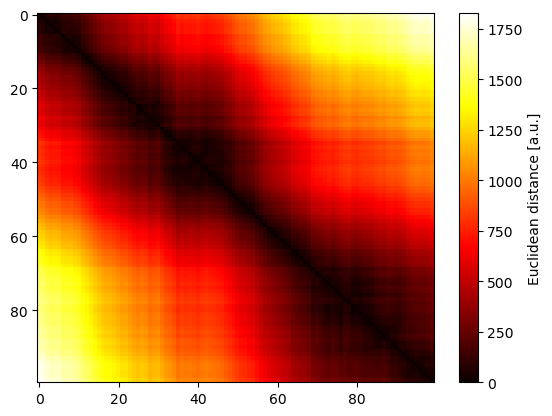

In [19]:
visualize_dmap(pred_structure_list[0][0], type_='flatten_distance_map')

In [20]:
true_structure, pred_structure = assign_clusters(np.array(templates_flatten), pred_structure_list[0])

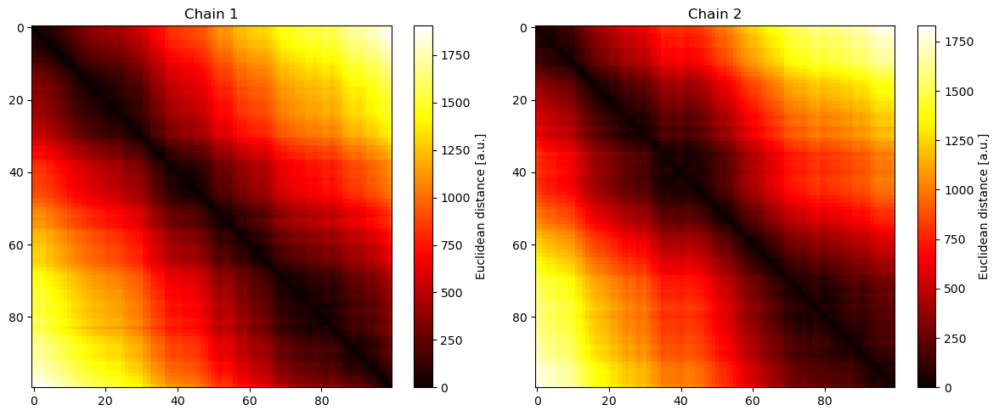

In [24]:
compare_distance_maps(true_structure[2], pred_structure[2], type1='flatten_distance_map', type2='flatten_distance_map')

In [34]:
np.array([np.sum(label_list == i) for i in np.unique(label_list)]) / len(label_list)

array([0.2002, 0.2005, 0.1996, 0.2006, 0.1991])

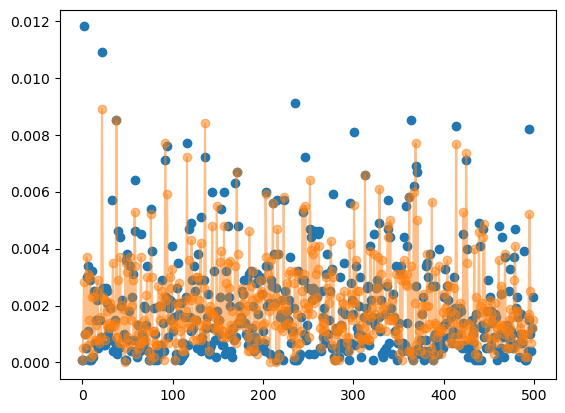

In [8]:
plt.plot(true_weights, 'o')
for i, x in enumerate(pred_weight_list):
    plt.plot(x, alpha=0.5, marker='o')

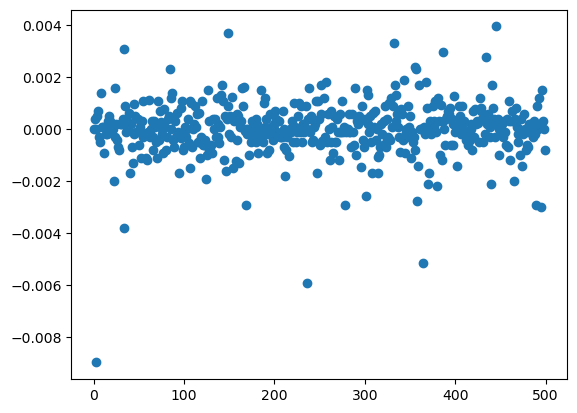

In [10]:
plt.plot(pred_weight_list.T-true_weights, 'o')

In [31]:
true_weights.shape

(498, 1)

In [13]:
lp_weight_cpu = jit(lambda x: -log_posterior(candidate_flatten_list, observation_flatten_list, x, measurement_error, num_probes, num_candidates, num_monomers**2), backend='cpu')

In [98]:
random_prob = np.random.rand(num_candidates)

In [97]:
np.sum(scipy.special.kl_div(true_weights.flatten(), pred_weight_list[0].flatten()))

1.7256574925089656

In [47]:
num_candidates

100

In [70]:
 def run_solver_structure(x):
   # Generate candidate structures
   candidate_polymer_list = [generate_gaussian_chain(num_monomers, mean_bond_length, std_bond_length) for _ in range(num_candidates)]
   candidate_flatten_list = [squareform(pdist(polymer)).flatten() for polymer in candidate_polymer_list]
   print(len(candidate_flatten_list))

   solver = ProjectedGradient(fun=lp_structure, projection=projection_non_negative, implicit_diff=True, verbose=False, maxiter=1) 
   sol = solver.run(candidate_flatten_list)
   
   return np.array(sol.params)

In [71]:
pred_structure_list = jax.vmap(run_solver_structure, in_axes=0)(range(5))

100
log prob = [-592791.82372283 -276531.93216003 -562596.74260634 ... -307730.85331573
 -205988.05760575  -82047.093629  ]
log prob = [ -41592.97466759 -143418.61693467 -408540.62194566 ...  -82397.00533457
  -53003.93045963 -124053.49436457]
log prob = [-178495.55011738  -51066.56019914 -329027.64827882 ...  -51071.20738166
  -79118.12033457 -152151.8060168 ]
log prob = [-591095.33321127 -313771.11408163 -307119.95211597 ... -199901.37879331
 -174041.38413013 -184980.21196659]


In [77]:
np.array(templates_flatten).shape

(100, 10000)

In [74]:
pred_structure_list[0].shape

(100, 10000)

In [60]:
pred_structure_list = run_solver_structure(0)

100
log prob = [-352090.12383956 -204907.13789568 -465339.42229907 ...  -80445.35305292
 -193220.5658151  -121767.39389399]
log prob = [ -41626.545899    -41284.31608579 -370326.83363154 ...  -49128.06105356
 -100681.4795502  -176699.5209068 ]
log prob = [-122103.06368577  -91924.78491578 -388470.27645217 ...  -96943.03756563
 -120954.46829925 -209395.46473529]
log prob = [-359941.84092015 -247468.24022296 -307448.6253339  ... -187075.90342386
 -217230.74341044 -245578.0075747 ]


In [69]:
np.array(pred_structure_list.params).shape

(100, 10000)

In [4]:
# Test multiple dataset simultaneously
# Vmap does not work because template list is a list that contains dictionary 
# Use Multiprocessing instead

def generate_gaussian_chain_jax(num_monomers: int, 
                            mean_bond_length: float, 
                            std_bond_length: float,
                            key) -> np.ndarray:
    """Generate a Gaussian chain polymer 
    
    Parameters
    ----------
    num_monomers : int 
                  number of polymers in a chain 
    mean_bond_length : float
                      average distance between two neighboring monomers 
    std_bond_length : float
                     standard deviation of distance between two neighboring monomers 
    
    Returns
    ------
    ArrayLike
        an `num_monomers-by-3` numpy.ndarray of monomer coordinates
        
    """ 
    # Generate steps: each step is a 3D vector 
    steps = mean_bond_length + std_bond_length * jax.random.normal(key, shape=(num_monomers, 3))

    # Compute positions by cumulative sum of steps
    positions = jnp.cumsum(steps, axis=0)
    
    return positions

def pdist_jax(X):
    """Compute the pairwise Euclidean distance matrix."""
    X = jnp.asarray(X)
    n = X.shape[0]
    dist_matrix = jax.vmap(
        lambda x: jnp.sqrt(((X - x) ** 2).sum(axis=1))
    )(X)
    return dist_matrix


def squareform_jax(dists):
    """Convert a vector-form distance vector to a square-form distance matrix."""
    n = int(jnp.sqrt(dists.shape[0] * 2) + 1)
    idx = jnp.tril_indices(n, -1)
    result = jnp.zeros((n, n))
    result = result.at[idx].set(dists)
    result = result + result.T
    return result


def compute_squareform_pdist(X):
    """Compute the pairwise distance matrix and convert it to square form."""
    dists = pdist_jax(X)
    dists_tril = dists[jnp.tril_indices(dists.shape[0], k=-1)]
    square_dists = squareform_jax(dists_tril)
    return square_dists

def run_optimization(dataset_list, param_dict, save_path, dataset_idx):
    # Unpack the param dict
    num_monomers = param_dict['num_monomers']
    mean_bond_length = param_dict['mean_bond_length']
    std_bond_length = param_dict['std_bond_length'] 
    num_templates = param_dict['num_templates']
    measurement_error = param_dict['noise_std']
    weight_dist = param_dict['weights_dist']
    num_probes = num_monomers
    num_candidates = num_templates
    
    # Generate variables for the optimization
    template_list = dataset_list[dataset_idx]['template_chain_list']
    X = dataset_list[dataset_idx]['observation_list']
    label_list = dataset_list[dataset_idx]['labels']
    observation_flatten_list = [squareform(pdist(x)).flatten() for x in X]

    # generate weight of each label from label_list
    true_weights = np.array([np.sum(label_list == i) for i in np.unique(label_list)]) / len(label_list)
    true_weights = true_weights.reshape(-1, 1)
    templates_flatten = [squareform(pdist(x)).flatten() for x in template_list]
    
    # Transform the true weights so that they are not in the simplex
    # The input to the optimization algorithm should be in the real space
    true_weights_transformed = jnp.log(true_weights) 

    lp_structure = jit(lambda x: -log_posterior(x, observation_flatten_list, true_weights_transformed, measurement_error, num_probes, num_candidates, num_monomers**2))
    lp_weight = jit(lambda x: -log_posterior(templates_flatten, observation_flatten_list, x, measurement_error, num_probes, num_candidates, num_monomers**2))
    
    # Generate a starting key
    key = jax.random.PRNGKey(118)
    subkeys = random.split(key, 100)
     
    def run_solver_structure(x, k):
        # Generate candidate structures
        candidate_polymer_list = [generate_gaussian_chain_jax(num_monomers, mean_bond_length, std_bond_length, k) for _ in range(num_candidates)]
        candidate_flatten_list = [compute_squareform_pdist(polymer).flatten() for polymer in candidate_polymer_list]
    
        solver = ProjectedGradient(fun=lp_structure, projection=projection_non_negative, implicit_diff=True, verbose=False)
        sol = solver.run(candidate_flatten_list)
        return jnp.array(sol.params)
    
    def run_solver_weight(x, k):
        solver = jaxopt.BFGS(fun=lp_weight, verbose=False)
        sol = solver.run(jax.random.normal(k, shape=(num_candidates, )))
        pred_weights = jax.nn.softmax(sol.params)
        return pred_weights
    
    pred_weight_list = jax.vmap(run_solver_weight, in_axes=(0, 0))(range(100), subkeys)
    pred_structure_list = jax.vmap(run_solver_structure, in_axes=(0, 0))(range(100), subkeys)
    
    # Calculate mean KL loss for weight predictions across different optimization attempts 
    kl_loss = [np.sum(scipy.special.kl_div(true_weights.flatten(), x.flatten())) for x in pred_weight_list]
    
    # Calculate mean MSE loss for structure predictions across different optimization attempts
    mse_loss = []
    for i in range(len(pred_structure_list)):
        true_structure, pred_structure = assign_clusters(np.array(templates_flatten), pred_structure_list[i])
        mse = np.mean([np.linalg.norm(x-y) for x, y in zip(true_structure, pred_structure)])
        mse_loss.append(mse)
        
    # Write the results to a file
    # name of the file contains the parameters of the dataset and the index
    save_file = save_path + 'dataset_{}_{}_{}_{}_{}_{}_{}_results.txt'.format(num_monomers, mean_bond_length, std_bond_length, num_templates, weight_dist, measurement_error, dataset_idx)
    
    # Write results to file
    with open(save_file, 'w') as f:
        # Write KL loss and MSE loss in columns 
        f.write('KL Loss, MSE Loss\n')
        for kl, mse in zip(kl_loss, mse_loss):
            f.write('{}, {}\n'.format(kl, mse))
        
    return kl_loss, mse_loss

In [80]:
key = jax.random.PRNGKey(118)

In [87]:
def generate_gaussian_chain_jax(num_monomers: int, 
                            mean_bond_length: float, 
                            std_bond_length: float,
                            key) -> np.ndarray:
    """Generate a Gaussian chain polymer 
    
    Parameters
    ----------
    num_monomers : int 
                  number of polymers in a chain 
    mean_bond_length : float
                      average distance between two neighboring monomers 
    std_bond_length : float
                     standard deviation of distance between two neighboring monomers 
    
    Returns
    ------
    ArrayLike
        an `num_monomers-by-3` numpy.ndarray of monomer coordinates
        
    """ 
    # Generate steps: each step is a 3D vector 
    steps = mean_bond_length + std_bond_length * jax.random.normal(key, shape=(num_monomers, 3))

    # Compute positions by cumulative sum of steps
    positions = jnp.cumsum(steps, axis=0)
    
    return positions


In [90]:
squareform(pdist(generate_gaussian_chain_jax(100, 10, 20, key)))

array([[   0.        ,   30.51913104,   50.39595282, ..., 1714.07097296,
        1734.01641579, 1725.19692579],
       [  30.51913104,    0.        ,   36.83103505, ..., 1695.17249846,
        1714.57240458, 1705.1790605 ],
       [  50.39595282,   36.83103505,    0.        , ..., 1667.08000775,
        1686.87260253, 1677.8403794 ],
       ...,
       [1714.07097296, 1695.17249846, 1667.08000775, ...,    0.        ,
          44.03437927,   82.6708121 ],
       [1734.01641579, 1714.57240458, 1686.87260253, ...,   44.03437927,
           0.        ,   44.2504735 ],
       [1725.19692579, 1705.1790605 , 1677.8403794 , ...,   82.6708121 ,
          44.2504735 ,    0.        ]])

In [98]:
def pdist_jax(X):
    """Compute the pairwise Euclidean distance matrix."""
    X = jnp.asarray(X)
    n = X.shape[0]
    dist_matrix = jax.vmap(
        lambda x: jnp.sqrt(((X - x) ** 2).sum(axis=1))
    )(X)
    return dist_matrix

def squareform_jax(dists):
    """Convert a vector-form distance vector to a square-form distance matrix."""
    n = int(jnp.sqrt(dists.shape[0] * 2) + 1)
    idx = jnp.tril_indices(n, -1)
    result = jnp.zeros((n, n))
    result = result.at[idx].set(dists)
    result = result + result.T
    return result

def compute_squareform_pdist(X):
    """Compute the pairwise distance matrix and convert it to square form."""
    dists = pdist_jax(X)
    dists_tril = dists[jnp.tril_indices(dists.shape[0], k=-1)]
    square_dists = squareform_jax(dists_tril)
    return square_dists

In [99]:
compute_squareform_pdist(generate_gaussian_chain_jax(100, 10, 20, key))

Array([[   0.        ,   30.51913104,   50.39595282, ..., 1714.07097296,
        1734.01641579, 1725.19692579],
       [  30.51913104,    0.        ,   36.83103505, ..., 1695.17249846,
        1714.57240458, 1705.1790605 ],
       [  50.39595282,   36.83103505,    0.        , ..., 1667.08000775,
        1686.87260253, 1677.8403794 ],
       ...,
       [1714.07097296, 1695.17249846, 1667.08000775, ...,    0.        ,
          44.03437927,   82.6708121 ],
       [1734.01641579, 1714.57240458, 1686.87260253, ...,   44.03437927,
           0.        ,   44.2504735 ],
       [1725.19692579, 1705.1790605 , 1677.8403794 , ...,   82.6708121 ,
          44.2504735 ,    0.        ]], dtype=float64)

In [97]:
jax.Device

jaxlib.xla_extension.Device

In [84]:
jax.nn.softmax(jax.random.normal(key, shape=(100,)))

Array([6.03637208e-03, 9.90807675e-04, 2.38428928e-02, 1.04513490e-02,
       1.16193269e-02, 3.89497026e-03, 8.07975481e-03, 2.17466933e-02,
       5.48927622e-03, 1.11096146e-02, 4.06560340e-03, 9.03837820e-03,
       6.19410077e-03, 1.54414285e-02, 1.36159769e-03, 9.84077972e-03,
       4.95618740e-03, 1.57261748e-02, 6.87901970e-03, 8.93222944e-03,
       4.78978344e-03, 2.00822795e-02, 2.07070862e-02, 6.62520064e-03,
       1.77463448e-03, 6.52073195e-03, 2.49662675e-03, 1.73245878e-03,
       1.62110376e-03, 1.29976148e-02, 1.26504073e-02, 7.96330625e-05,
       3.11098642e-03, 3.34085767e-03, 1.21303142e-02, 8.71440391e-03,
       1.24122851e-02, 4.57146292e-03, 2.23098928e-02, 5.76431414e-04,
       2.19904019e-03, 1.71085822e-03, 4.72962341e-03, 6.06535425e-03,
       1.19583457e-02, 3.88577541e-03, 1.71565355e-03, 1.08647067e-02,
       3.69529454e-02, 1.37115573e-02, 5.82772838e-03, 3.64528787e-03,
       1.15520684e-02, 6.75259915e-03, 4.55490384e-03, 1.73697391e-03,
      

In [5]:
import torch.multiprocessing

In [6]:
try:
     torch.multiprocessing.set_start_method('spawn')
except RuntimeError:
    pass

with torch.multiprocessing.Pool() as pool:
    loss_list = pool.map(run_optimization, range(10))

Process SpawnPoolWorker-19:
Traceback (most recent call last):
  File "/mnt/sw/nix/store/gpkc8q6zjnp3n3h3w9hbmbj6gjbxs85w-python-3.10.10-view/lib/python3.10/multiprocessing/process.py", line 314, in _bootstrap
    self.run()
  File "/mnt/sw/nix/store/gpkc8q6zjnp3n3h3w9hbmbj6gjbxs85w-python-3.10.10-view/lib/python3.10/multiprocessing/process.py", line 108, in run
    self._target(*self._args, **self._kwargs)
  File "/mnt/sw/nix/store/gpkc8q6zjnp3n3h3w9hbmbj6gjbxs85w-python-3.10.10-view/lib/python3.10/multiprocessing/pool.py", line 114, in worker
    task = get()
  File "/mnt/sw/nix/store/gpkc8q6zjnp3n3h3w9hbmbj6gjbxs85w-python-3.10.10-view/lib/python3.10/multiprocessing/queues.py", line 367, in get
    return _ForkingPickler.loads(res)
AttributeError: Can't get attribute 'run_optimization' on <module '__main__' (built-in)>
Process SpawnPoolWorker-17:
Traceback (most recent call last):
  File "/mnt/sw/nix/store/gpkc8q6zjnp3n3h3w9hbmbj6gjbxs85w-python-3.10.10-view/lib/python3.10/multiproc

KeyboardInterrupt: 

In [36]:
loss_list = []
for i in tqdm(range(10)):
    loss_list.append(run_optimization(i))

  0%|          | 0/10 [00:00<?, ?it/s]

1.0
1.0
INFO: jaxopt.ZoomLineSearch: Iter: 1 Minimum Decrease & Curvature Errors (stop. crit.): inf Stepsize:1.0  Decrease Error:inf  Curvature Error:inf 
1.0
INFO: jaxopt.ZoomLineSearch: Iter: 2 Minimum Decrease & Curvature Errors (stop. crit.): 3799147.468591597 Stepsize:0.5  Decrease Error:3014816.790738364  Curvature Error:3799147.468591597 
1.0
INFO: jaxopt.ZoomLineSearch: Iter: 3 Minimum Decrease & Curvature Errors (stop. crit.): 3799147.468591597 Stepsize:0.322597420537615  Decrease Error:1923982.7257980509  Curvature Error:3799147.468591597 
0.9999999999999999
INFO: jaxopt.ZoomLineSearch: Iter: 4 Minimum Decrease & Curvature Errors (stop. crit.): 3799147.466995948 Stepsize:0.04910943386923771  Decrease Error:242327.28925739627  Curvature Error:3799147.466995948 
0.9999999999999999
INFO: jaxopt.ZoomLineSearch: Iter: 5 Minimum Decrease & Curvature Errors (stop. crit.): 994738.1634554584 Stepsize:0.008496214531553848  Decrease Error:0.0  Curvature Error:994738.1634554584 
1.0
INFO

2024-07-08 12:07:13.682422: E external/org_tensorflow/tensorflow/compiler/xla/pjrt/pjrt_stream_executor_client.cc:2410] Execution of replica 0 failed: INTERNAL: Failed to execute XLA Runtime executable: run time error: custom call 'xla.gpu.custom_call' failed: CpuCallback error: KeyboardInterrupt: <EMPTY MESSAGE>

At:
  /mnt/sw/nix/store/gpkc8q6zjnp3n3h3w9hbmbj6gjbxs85w-python-3.10.10-view/lib/python3.10/site-packages/jax/interpreters/mlir.py(1788): _wrapped_callback
  /mnt/sw/nix/store/gpkc8q6zjnp3n3h3w9hbmbj6gjbxs85w-python-3.10.10-view/lib/python3.10/site-packages/jax/_src/interpreters/pxla.py(2090): _call_with_tokens
  /mnt/sw/nix/store/gpkc8q6zjnp3n3h3w9hbmbj6gjbxs85w-python-3.10.10-view/lib/python3.10/site-packages/jax/_src/interpreters/pxla.py(2106): __call__
  /mnt/sw/nix/store/gpkc8q6zjnp3n3h3w9hbmbj6gjbxs85w-python-3.10.10-view/lib/python3.10/site-packages/jax/_src/profiler.py(314): wrapper
  /mnt/sw/nix/store/gpkc8q6zjnp3n3h3w9hbmbj6gjbxs85w-python-3.10.10-view/lib/python3.1

XlaRuntimeError: INTERNAL: Failed to execute XLA Runtime executable: run time error: custom call 'xla.gpu.custom_call' failed: CpuCallback error: KeyboardInterrupt: <EMPTY MESSAGE>

At:
  /mnt/sw/nix/store/gpkc8q6zjnp3n3h3w9hbmbj6gjbxs85w-python-3.10.10-view/lib/python3.10/site-packages/jax/interpreters/mlir.py(1788): _wrapped_callback
  /mnt/sw/nix/store/gpkc8q6zjnp3n3h3w9hbmbj6gjbxs85w-python-3.10.10-view/lib/python3.10/site-packages/jax/_src/interpreters/pxla.py(2090): _call_with_tokens
  /mnt/sw/nix/store/gpkc8q6zjnp3n3h3w9hbmbj6gjbxs85w-python-3.10.10-view/lib/python3.10/site-packages/jax/_src/interpreters/pxla.py(2106): __call__
  /mnt/sw/nix/store/gpkc8q6zjnp3n3h3w9hbmbj6gjbxs85w-python-3.10.10-view/lib/python3.10/site-packages/jax/_src/profiler.py(314): wrapper
  /mnt/sw/nix/store/gpkc8q6zjnp3n3h3w9hbmbj6gjbxs85w-python-3.10.10-view/lib/python3.10/site-packages/jax/_src/dispatch.py(124): apply_primitive
  /mnt/sw/nix/store/gpkc8q6zjnp3n3h3w9hbmbj6gjbxs85w-python-3.10.10-view/lib/python3.10/site-packages/jax/_src/core.py(728): process_primitive
  /mnt/sw/nix/store/gpkc8q6zjnp3n3h3w9hbmbj6gjbxs85w-python-3.10.10-view/lib/python3.10/site-packages/jax/_src/core.py(346): bind_with_trace
  /mnt/sw/nix/store/gpkc8q6zjnp3n3h3w9hbmbj6gjbxs85w-python-3.10.10-view/lib/python3.10/site-packages/jax/_src/core.py(2494): bind
  /mnt/sw/nix/store/gpkc8q6zjnp3n3h3w9hbmbj6gjbxs85w-python-3.10.10-view/lib/python3.10/site-packages/jax/_src/lax/control_flow/loops.py(1110): while_loop
  /mnt/sw/nix/store/gpkc8q6zjnp3n3h3w9hbmbj6gjbxs85w-python-3.10.10-view/lib/python3.10/site-packages/jax/_src/traceback_util.py(163): reraise_with_filtered_traceback
  /mnt/home/tudomlumleart/.local/lib/python3.10/site-packages/jaxopt/_src/loop.py(60): _while_loop_lax
  /mnt/home/tudomlumleart/.local/lib/python3.10/site-packages/jaxopt/_src/loop.py(82): while_loop
  /mnt/home/tudomlumleart/.local/lib/python3.10/site-packages/jaxopt/_src/base.py(326): _run
  /mnt/home/tudomlumleart/.local/lib/python3.10/site-packages/jaxopt/_src/implicit_diff.py(207): solver_fun_flat
  /mnt/sw/nix/store/gpkc8q6zjnp3n3h3w9hbmbj6gjbxs85w-python-3.10.10-view/lib/python3.10/site-packages/jax/_src/linear_util.py(165): call_wrapped
  /mnt/sw/nix/store/gpkc8q6zjnp3n3h3w9hbmbj6gjbxs85w-python-3.10.10-view/lib/python3.10/site-packages/jax/_src/core.py(747): process_custom_vjp_call
  /mnt/sw/nix/store/gpkc8q6zjnp3n3h3w9hbmbj6gjbxs85w-python-3.10.10-view/lib/python3.10/site-packages/jax/_src/custom_derivatives.py(668): bind
  /mnt/sw/nix/store/gpkc8q6zjnp3n3h3w9hbmbj6gjbxs85w-python-3.10.10-view/lib/python3.10/site-packages/jax/_src/custom_derivatives.py(548): __call__
  /mnt/sw/nix/store/gpkc8q6zjnp3n3h3w9hbmbj6gjbxs85w-python-3.10.10-view/lib/python3.10/site-packages/jax/_src/traceback_util.py(163): reraise_with_filtered_traceback
  /mnt/home/tudomlumleart/.local/lib/python3.10/site-packages/jaxopt/_src/implicit_diff.py(251): wrapped_solver_fun
  /mnt/home/tudomlumleart/.local/lib/python3.10/site-packages/jaxopt/_src/base.py(359): run
  /tmp/ipykernel_118908/4141869316.py(45): run_solver_weight
  /mnt/sw/nix/store/gpkc8q6zjnp3n3h3w9hbmbj6gjbxs85w-python-3.10.10-view/lib/python3.10/site-packages/jax/_src/linear_util.py(165): call_wrapped
  /mnt/sw/nix/store/gpkc8q6zjnp3n3h3w9hbmbj6gjbxs85w-python-3.10.10-view/lib/python3.10/site-packages/jax/_src/api.py(1757): vmap_f
  /mnt/sw/nix/store/gpkc8q6zjnp3n3h3w9hbmbj6gjbxs85w-python-3.10.10-view/lib/python3.10/site-packages/jax/_src/traceback_util.py(163): reraise_with_filtered_traceback
  /tmp/ipykernel_118908/4141869316.py(49): run_optimization
  /tmp/ipykernel_118908/2648210417.py(3): <module>
  /mnt/sw/nix/store/gpkc8q6zjnp3n3h3w9hbmbj6gjbxs85w-python-3.10.10-view/lib/python3.10/site-packages/IPython/core/interactiveshell.py(3460): run_code
  /mnt/sw/nix/store/gpkc8q6zjnp3n3h3w9hbmbj6gjbxs85w-python-3.10.10-view/lib/python3.10/site-packages/IPython/core/interactiveshell.py(3400): run_ast_nodes
  /mnt/sw/nix/store/gpkc8q6zjnp3n3h3w9hbmbj6gjbxs85w-python-3.10.10-view/lib/python3.10/site-packages/IPython/core/interactiveshell.py(3221): run_cell_async
  /mnt/sw/nix/store/gpkc8q6zjnp3n3h3w9hbmbj6gjbxs85w-python-3.10.10-view/lib/python3.10/site-packages/IPython/core/async_helpers.py(129): _pseudo_sync_runner
  /mnt/sw/nix/store/gpkc8q6zjnp3n3h3w9hbmbj6gjbxs85w-python-3.10.10-view/lib/python3.10/site-packages/IPython/core/interactiveshell.py(3016): _run_cell
  /mnt/sw/nix/store/gpkc8q6zjnp3n3h3w9hbmbj6gjbxs85w-python-3.10.10-view/lib/python3.10/site-packages/IPython/core/interactiveshell.py(2961): run_cell
  /mnt/sw/nix/store/gpkc8q6zjnp3n3h3w9hbmbj6gjbxs85w-python-3.10.10-view/lib/python3.10/site-packages/ipykernel/zmqshell.py(540): run_cell
  /mnt/sw/nix/store/gpkc8q6zjnp3n3h3w9hbmbj6gjbxs85w-python-3.10.10-view/lib/python3.10/site-packages/ipykernel/ipkernel.py(422): do_execute
  /mnt/sw/nix/store/gpkc8q6zjnp3n3h3w9hbmbj6gjbxs85w-python-3.10.10-view/lib/python3.10/site-packages/ipykernel/kernelbase.py(729): execute_request
  /mnt/sw/nix/store/gpkc8q6zjnp3n3h3w9hbmbj6gjbxs85w-python-3.10.10-view/lib/python3.10/site-packages/ipykernel/kernelbase.py(409): dispatch_shell
  /mnt/sw/nix/store/gpkc8q6zjnp3n3h3w9hbmbj6gjbxs85w-python-3.10.10-view/lib/python3.10/site-packages/ipykernel/kernelbase.py(502): process_one
  /mnt/sw/nix/store/gpkc8q6zjnp3n3h3w9hbmbj6gjbxs85w-python-3.10.10-view/lib/python3.10/site-packages/ipykernel/kernelbase.py(513): dispatch_queue
  /mnt/sw/nix/store/gpkc8q6zjnp3n3h3w9hbmbj6gjbxs85w-python-3.10.10-view/lib/python3.10/asyncio/events.py(80): _run
  /mnt/sw/nix/store/gpkc8q6zjnp3n3h3w9hbmbj6gjbxs85w-python-3.10.10-view/lib/python3.10/asyncio/base_events.py(1909): _run_once
  /mnt/sw/nix/store/gpkc8q6zjnp3n3h3w9hbmbj6gjbxs85w-python-3.10.10-view/lib/python3.10/asyncio/base_events.py(603): run_forever
  /mnt/sw/nix/store/gpkc8q6zjnp3n3h3w9hbmbj6gjbxs85w-python-3.10.10-view/lib/python3.10/site-packages/tornado/platform/asyncio.py(215): start
  /mnt/sw/nix/store/gpkc8q6zjnp3n3h3w9hbmbj6gjbxs85w-python-3.10.10-view/lib/python3.10/site-packages/ipykernel/kernelapp.py(725): start
  /mnt/sw/nix/store/gpkc8q6zjnp3n3h3w9hbmbj6gjbxs85w-python-3.10.10-view/lib/python3.10/site-packages/traitlets/config/application.py(1043): launch_instance
  /mnt/sw/nix/store/gpkc8q6zjnp3n3h3w9hbmbj6gjbxs85w-python-3.10.10-view/lib/python3.10/site-packages/ipykernel_launcher.py(17): <module>
  /mnt/sw/nix/store/gpkc8q6zjnp3n3h3w9hbmbj6gjbxs85w-python-3.10.10-view/lib/python3.10/runpy.py(86): _run_code
  /mnt/sw/nix/store/gpkc8q6zjnp3n3h3w9hbmbj6gjbxs85w-python-3.10.10-view/lib/python3.10/runpy.py(196): _run_module_as_main
.

In [32]:
weight_loss, structure_loss = run_optimization(1)

1.0000000000000002
1.0
INFO: jaxopt.ZoomLineSearch: Iter: 1 Minimum Decrease & Curvature Errors (stop. crit.): inf Stepsize:1.0  Decrease Error:inf  Curvature Error:inf 
1.0
INFO: jaxopt.ZoomLineSearch: Iter: 2 Minimum Decrease & Curvature Errors (stop. crit.): inf Stepsize:0.5  Decrease Error:inf  Curvature Error:inf 
1.0
INFO: jaxopt.ZoomLineSearch: Iter: 3 Minimum Decrease & Curvature Errors (stop. crit.): 2391858.0262966356 Stepsize:0.2873583193074892  Decrease Error:1308237.5992334737  Curvature Error:2391858.0262966356 
1.0000000000000002
INFO: jaxopt.ZoomLineSearch: Iter: 4 Minimum Decrease & Curvature Errors (stop. crit.): 2391839.721568016 Stepsize:0.05228856166537746  Decrease Error:194883.81760327832  Curvature Error:2391839.721568016 
0.9999999999999998
INFO: jaxopt.ZoomLineSearch: Iter: 5 Minimum Decrease & Curvature Errors (stop. crit.): 979994.2378889723 Stepsize:0.010755180166677897  Decrease Error:2472.1720590853565  Curvature Error:979994.2378889723 
1.0
INFO: jaxopt.

In [34]:
np.mean(structure_loss)**2

222299113.71899685

In [2]:
import os
dir_ = '/mnt/home/tudomlumleart/ceph/03_GaussianChainSimulation/20240627/'
pickle_files = [os.path.join(dir_, f) for f in os.listdir(dir_) if f.endswith('.pkl')]

In [6]:
pickle_files_base = set([f.rsplit('_', 1)[0] for f in os.listdir(dir_) if f.endswith('.pkl')])

In [7]:
pickle_files_base

{'dataset_100_10_20_100_0_10.0',
 'dataset_100_10_20_100_0_100.0',
 'dataset_100_10_20_100_0_2.0',
 'dataset_100_10_20_100_0_20.0',
 'dataset_100_10_20_100_0_40.0',
 'dataset_100_10_20_100_1000_10.0',
 'dataset_100_10_20_100_1000_100.0',
 'dataset_100_10_20_100_1000_2.0',
 'dataset_100_10_20_100_1000_20.0',
 'dataset_100_10_20_100_1000_40.0',
 'dataset_100_10_20_100_1_10.0',
 'dataset_100_10_20_100_1_100.0',
 'dataset_100_10_20_100_1_2.0',
 'dataset_100_10_20_100_1_20.0',
 'dataset_100_10_20_100_1_40.0',
 'dataset_100_10_20_10_0_10.0',
 'dataset_100_10_20_10_0_100.0',
 'dataset_100_10_20_10_0_2.0',
 'dataset_100_10_20_10_0_20.0',
 'dataset_100_10_20_10_0_40.0',
 'dataset_100_10_20_10_1000_10.0',
 'dataset_100_10_20_10_1000_100.0',
 'dataset_100_10_20_10_1000_2.0',
 'dataset_100_10_20_10_1000_20.0',
 'dataset_100_10_20_10_1000_40.0',
 'dataset_100_10_20_10_1_10.0',
 'dataset_100_10_20_10_1_100.0',
 'dataset_100_10_20_10_1_2.0',
 'dataset_100_10_20_10_1_20.0',
 'dataset_100_10_20_10_1_40

In [19]:
import os 
import time 
import subprocess 
 
def load_pickle_files_and_submit_jobs(directory, sleep_interval=10):
    processed_files = set()

    def get_current_job_count():
        result = subprocess.run(['squeue', '-u', os.getenv('USER')], stdout=subprocess.PIPE)
        job_lines = result.stdout.decode('utf-8').split('\n')
        return len(job_lines) - 1  # Subtracting 1 to exclude the header line
    
    def submit_job(pickle_file):
        slurm_path = '/mnt/home/tudomlumleart/ceph/01_ChromatinEnsembleRefinement/chromatin-ensemble-refinement/scripts/slurm/20240708_EvaluateStructureWeightMAP.sh'
        subprocess.run(['sbatch', slurm_path, pickle_file])

    while True:
        # List all pickle files - only file name upto the last underscore
        # This is to check if the files have already been processed
        pickle_files_base = set([f.rsplit('_', 1)[0] for f in os.listdir(directory) if f.endswith('.pkl')])
        
        # Check processed files in the results directory
        # List all files in the results directory with full paths
        # Change the file extension to .pkl for comparison with files in pickle_files
        results_dir = os.path.join(directory, 'results_WeightStructureOptim_20240708')
        processed_file_new = set([f.rsplit('_', 2)[0] for f in os.listdir(results_dir) if f.endswith('.txt')])
        processed_files |= processed_file_new
        print(processed_files)

        # Filter out files that have already been processed
        new_files = [f for f in pickle_files_base if f not in processed_files]
        
        print('Number of new files: ', len(new_files))

        # If there are no new files and all files have been processed, break the loop
        if not new_files and all(f in processed_files for f in pickle_files):
            print("All files have been processed and no new files are found.")
            break

        # Submit jobs for new files
        # Submit 100 files at a time
        # Make sure that the number of jobs does not go over 50
        for fi in new_files:
            fi = os.path.join(directory, fi + '_10000.pkl')
            print(fi)
            # Check if the number of jobs is less than 50
            # print current time 
            print('Current time: ', time.ctime())
            print('Current job count: ', get_current_job_count())
            if get_current_job_count() < 30:
                submit_job(fi)
                processed_files.add(fi)
            # If the number of jobs is more than 50, break
            else:
                break

        time.sleep(sleep_interval)

In [26]:
directory = '/mnt/home/tudomlumleart/ceph/03_GaussianChainSimulation/20240627/'
load_pickle_files_and_submit_jobs(directory, sleep_interval=10)

set()
Number of new files:  105
/mnt/home/tudomlumleart/ceph/03_GaussianChainSimulation/20240627/dataset_100_10_20_10_1_2.0_10000.pkl
Current time:  Tue Jul  9 00:38:49 2024
Current job count:  2
Submitted batch job 3591009
/mnt/home/tudomlumleart/ceph/03_GaussianChainSimulation/20240627/dataset_100_10_20_10_1_100.0_10000.pkl
Current time:  Tue Jul  9 00:38:49 2024
Current job count:  3
Submitted batch job 3591010
/mnt/home/tudomlumleart/ceph/03_GaussianChainSimulation/20240627/dataset_100_10_20_250_0_20.0_10000.pkl
Current time:  Tue Jul  9 00:38:49 2024
Current job count:  4
Submitted batch job 3591011
/mnt/home/tudomlumleart/ceph/03_GaussianChainSimulation/20240627/dataset_100_10_20_5_0_40.0_10000.pkl
Current time:  Tue Jul  9 00:38:49 2024
Current job count:  5
Submitted batch job 3591012
/mnt/home/tudomlumleart/ceph/03_GaussianChainSimulation/20240627/dataset_100_10_20_100_0_10.0_10000.pkl
Current time:  Tue Jul  9 00:38:49 2024
Current job count:  6
Submitted batch job 3591013
/m

squeue: error: slurm_msg_sendto: address:port=10.128.144.3:6802 msg_type=2049: Unexpected missing socket error


Submitted batch job 3592232
/mnt/home/tudomlumleart/ceph/03_GaussianChainSimulation/20240627/dataset_100_10_20_100_0_10.0_10000.pkl
Current time:  Tue Jul  9 03:36:03 2024
Current job count:  27
Submitted batch job 3592233
/mnt/home/tudomlumleart/ceph/03_GaussianChainSimulation/20240627/dataset_100_10_20_100_1000_40.0_10000.pkl
Current time:  Tue Jul  9 03:36:03 2024
Current job count:  28
Submitted batch job 3592234
/mnt/home/tudomlumleart/ceph/03_GaussianChainSimulation/20240627/dataset_100_10_20_100_1000_20.0_10000.pkl
Current time:  Tue Jul  9 03:36:03 2024
Current job count:  29
Submitted batch job 3592235
/mnt/home/tudomlumleart/ceph/03_GaussianChainSimulation/20240627/dataset_100_10_20_100_1000_10.0_10000.pkl
Current time:  Tue Jul  9 03:36:03 2024
Current job count:  30
{'dataset_100_10_20_10_1_2.0', 'dataset_100_10_20_10_1_100.0', 'dataset_100_10_20_5_0_40.0', '/mnt/home/tudomlumleart/ceph/03_GaussianChainSimulation/20240627/dataset_100_10_20_10_1_40.0_10000.pkl', '/mnt/home/t

KeyboardInterrupt: 